Lab 6: Black Jack Game

1. Set Up Classes and Skeleton Code

    a. Create a Card and Deck class:

In [11]:
import random

class Card:
    def __init__(self, suit, rank):
        self.suit = suit
        self.rank = rank

    def __str__(self):
        return f"{self.rank} of {self.suit}"


In [29]:
class Deck:
    def __init__(self, num_decks=6):
        suits = ['Hearts', 'Diamonds', 'Clubs', 'Spades']
        ranks = ['2', '3', '4', '5', '6', '7', '8', '9', '10', 'Jack', 'Queen', 'King', 'Ace']
        self.cards = [Card(suit, rank) for suit in suits for rank in ranks] * num_decks
        self.shuffle()
        self.plastic_index = random.randint(0, len(self.cards) - 1)  # Plastic card position

    def shuffle(self):
        random.shuffle(self.cards)

    def draw_card(self):
        if len(self.cards) == 0:
            print("Deck is empty. Reshuffling deck.")
            self.__init__()  # Reinitialize to reset the deck with the original number of cards

        card = self.cards.pop()
        
        # Check if the plastic card has been dealt and if we still have enough cards left
        if len(self.cards) > 0 and len(self.cards) == self.plastic_index:
            print("Plastic card dealt - reshuffling deck.")
            self.shuffle()
            # Only set a new plastic card if there are still cards to shuffle
            if len(self.cards) > 1:
                self.plastic_index = random.randint(0, len(self.cards) - 1)

        return card


In [30]:
# Create a deck with 6 sets of 52 cards
deck = Deck(num_decks=6)
# Draw a few cards to test
for _ in range(5):
    print(deck.draw_card())


Plastic card dealt - reshuffling deck.
2 of Spades
8 of Hearts
King of Diamonds
9 of Hearts
King of Clubs


2: Plastic Card and Shuffling

In [14]:
class Deck:
    def __init__(self, num_decks=6):
        suits = ['Hearts', 'Diamonds', 'Clubs', 'Spades']
        ranks = ['2', '3', '4', '5', '6', '7', '8', '9', '10', 'Jack', 'Queen', 'King', 'Ace']
        self.cards = [Card(suit, rank) for suit in suits for rank in ranks] * num_decks
        self.shuffle()
        self.plastic_index = random.randint(0, len(self.cards) - 1)  # Plastic card position

    def shuffle(self):
        random.shuffle(self.cards)

    def draw_card(self):
        if len(self.cards) == 0:
            raise ValueError("No cards left in the deck.")
        card = self.cards.pop()
        # Check if the plastic card has been dealt
        if len(self.cards) == self.plastic_index:
            print("Plastic card dealt - reshuffling deck.")
            self.shuffle()
            self.plastic_index = random.randint(0, len(self.cards) - 1)
        return card


In [ ]:
# Create a deck and draw cards until the plastic card is dealt
deck = Deck(num_decks=6)
for _ in range(60):
    print(deck.draw_card())

3: Player and Hand Classes

In [15]:
class Hand:
    def __init__(self):
        self.cards = []

    def add_card(self, card):
        self.cards.append(card)

    def get_value(self):
        # Simplified hand value calculation (for now)
        value = 0
        aces = 0
        for card in self.cards:
            if card.rank in ['Jack', 'Queen', 'King']:
                value += 10
            elif card.rank == 'Ace':
                aces += 1
                value += 11
            else:
                value += int(card.rank)
        while value > 21 and aces:
            value -= 10
            aces -= 1
        return value

    def __str__(self):
        return ", ".join(str(card) for card in self.cards)

class Player:
    def __init__(self, name, chips=100):
        self.name = name
        self.hand = Hand()
        self.chips = chips

    def hit(self, card):
        self.hand.add_card(card)

    def get_hand_value(self):
        return self.hand.get_value()


In [16]:
# Create a player and draw cards from the deck
deck = Deck()
player = Player(name="Test Player")
player.hit(deck.draw_card())
player.hit(deck.draw_card())
print(f"{player.name}'s hand: {player.hand}")
print(f"Hand value: {player.get_hand_value()}")


Test Player's hand: 7 of Spades, Queen of Diamonds
Hand value: 17


4: Game Skeleton and Dealer

In [17]:
class BlackjackGame:
    def __init__(self, num_players=1):
        self.deck = Deck(num_decks=6)
        self.players = [Player(name=f"Player {i+1}") for i in range(num_players)]
        self.dealer = Player(name="Dealer")

    def initial_deal(self):
        for _ in range(2):
            for player in self.players:
                player.hit(self.deck.draw_card())
            self.dealer.hit(self.deck.draw_card())

    def play_dealer(self):
        # Dealer hits on 16 or less
        while self.dealer.get_hand_value() < 17:
            self.dealer.hit(self.deck.draw_card())

    def show_hands(self):
        for player in self.players:
            print(f"{player.name}'s hand: {player.hand} (Value: {player.get_hand_value()})")
        print(f"Dealer's hand: {self.dealer.hand} (Value: {self.dealer.get_hand_value()})")


In [18]:
game = BlackjackGame(num_players=1)
game.initial_deal()
game.show_hands()
game.play_dealer()
game.show_hands()


Player 1's hand: Jack of Hearts, 4 of Hearts (Value: 14)
Dealer's hand: 10 of Hearts, Ace of Hearts (Value: 21)
Player 1's hand: Jack of Hearts, 4 of Hearts (Value: 14)
Dealer's hand: 10 of Hearts, Ace of Hearts (Value: 21)


In [ ]:
5: Adding a Human Player and Testing the Game

In [19]:
class Player:
    def __init__(self, name, chips=100, is_human=False):
        self.name = name
        self.hand = Hand()
        self.chips = chips
        self.is_human = is_human

    def hit(self, card):
        self.hand.add_card(card)

    def get_hand_value(self):
        return self.hand.get_value()

    def clear_hand(self):
        self.hand = Hand()

In [20]:
class BlackjackGame:
    def __init__(self, num_players=1, include_human=False):
        self.deck = Deck(num_decks=6)
        self.players = [Player(name=f"Player {i+1}") for i in range(num_players)]
        if include_human:
            self.players.append(Player(name="Human Player", is_human=True))
        self.dealer = Player(name="Dealer")

    def initial_deal(self):
        for _ in range(2):
            for player in self.players:
                player.hit(self.deck.draw_card())
            self.dealer.hit(self.deck.draw_card())

    def play_dealer(self):
        while self.dealer.get_hand_value() < 17:
            self.dealer.hit(self.deck.draw_card())

    def play_human(self, player):
        while True:
            print(f"{player.name}'s hand: {player.hand} (Value: {player.get_hand_value()})")
            move = input("Would you like to (h)it or (s)tand? ")
            if move.lower() == 'h':
                player.hit(self.deck.draw_card())
                if player.get_hand_value() > 21:
                    print(f"{player.name} busts!")
                    break
            elif move.lower() == 's':
                break

    def play_players(self):
        for player in self.players:
            if player.is_human:
                self.play_human(player)
            else:
                while player.get_hand_value() < 17:  # Simple AI strategy to hit below 17
                    player.hit(self.deck.draw_card())

    def show_hands(self, reveal_dealer=False):
        for player in self.players:
            print(f"{player.name}'s hand: {player.hand} (Value: {player.get_hand_value()})")
        if reveal_dealer:
            print(f"Dealer's hand: {self.dealer.hand} (Value: {self.dealer.get_hand_value()})")
        else:
            print(f"Dealer's hand: {self.dealer.hand.cards[0]} and [hidden card]")

    def reset_hands(self):
        for player in self.players:
            player.clear_hand()
        self.dealer.clear_hand()

    def play_round(self):
        self.initial_deal()
        self.show_hands()
        self.play_players()
        self.play_dealer()
        self.show_hands(reveal_dealer=True)
        self.reset_hands()

In [21]:
game = BlackjackGame(num_players=2, include_human=True)
game.play_round()

Player 1's hand: 7 of Hearts, 3 of Diamonds (Value: 10)
Player 2's hand: 5 of Hearts, 6 of Clubs (Value: 11)
Human Player's hand: 10 of Hearts, 6 of Hearts (Value: 16)
Dealer's hand: 6 of Diamonds and [hidden card]
Human Player's hand: 10 of Hearts, 6 of Hearts (Value: 16)


Would you like to (h)it or (s)tand?  h


Human Player busts!
Player 1's hand: 7 of Hearts, 3 of Diamonds, 4 of Clubs, 2 of Diamonds, Ace of Hearts (Value: 17)
Player 2's hand: 5 of Hearts, 6 of Clubs, Queen of Hearts (Value: 21)
Human Player's hand: 10 of Hearts, 6 of Hearts, 8 of Hearts (Value: 24)
Dealer's hand: 6 of Diamonds, King of Clubs, 7 of Clubs (Value: 23)


6: Implementing a Card Counting Strategy Player

In [22]:
class CardCountingPlayer(Player):
    def __init__(self, name, chips=100, threshold=0):
        super().__init__(name, chips)
        self.count = 0
        self.threshold = threshold

    def update_count(self, card):
        if card.rank in ['2', '3', '4', '5', '6']:
            self.count += 1
        elif card.rank in ['10', 'Jack', 'Queen', 'King', 'Ace']:
            self.count -= 1

    def decide_hit(self):
        return self.count < self.threshold


In [26]:
class BlackjackGame:
    def __init__(self, num_players=1, include_human=False, include_card_counter=False, threshold=0):
        self.deck = Deck(num_decks=6)
        self.players = [Player(name=f"Player {i+1}") for i in range(num_players)]
        if include_human:
            self.players.append(Player(name="Human Player", is_human=True))
        if include_card_counter:
            self.players.append(CardCountingPlayer(name="Card Counter", threshold=threshold))
        self.dealer = Player(name="Dealer")

    def initial_deal(self):
        for _ in range(2):
            for player in self.players:
                card = self.deck.draw_card()
                player.hit(card)
                if isinstance(player, CardCountingPlayer):
                    player.update_count(card)

            card = self.deck.draw_card()
            self.dealer.hit(card)
            for player in self.players:
                if isinstance(player, CardCountingPlayer):
                    player.update_count(card)

    def play_players(self):
        for player in self.players:
            if player.is_human:
                self.play_human(player)
            elif isinstance(player, CardCountingPlayer):
                while player.decide_hit():
                    card = self.deck.draw_card()
                    player.hit(card)
                    player.update_count(card)
            else:
                while player.get_hand_value() < 17:
                    player.hit(self.deck.draw_card())

    def play_dealer(self):
        while self.dealer.get_hand_value() < 17:
            self.dealer.hit(self.deck.draw_card())

    def show_hands(self, reveal_dealer=False):
        for player in self.players:
            print(f"{player.name}'s hand: {player.hand} (Value: {player.get_hand_value()})")
        if reveal_dealer:
            print(f"Dealer's hand: {self.dealer.hand} (Value: {self.dealer.get_hand_value()})")
        else:
            print(f"Dealer's hand: {self.dealer.hand.cards[0]} and [hidden card]")

    def reset_hands(self):
        for player in self.players:
            player.clear_hand()
        self.dealer.clear_hand()

    def play_round(self):
        self.initial_deal()
        self.show_hands()
        self.play_players()
        self.play_dealer()
        self.show_hands(reveal_dealer=True)
        self.reset_hands()


In [31]:
game = BlackjackGame(num_players=2, include_card_counter=True, threshold=-2)
game.play_round()

Player 1's hand: King of Hearts, 9 of Diamonds (Value: 19)
Player 2's hand: Queen of Diamonds, 3 of Spades (Value: 13)
Card Counter's hand: 2 of Clubs, Ace of Spades (Value: 13)
Dealer's hand: 9 of Clubs and [hidden card]
Player 1's hand: King of Hearts, 9 of Diamonds (Value: 19)
Player 2's hand: Queen of Diamonds, 3 of Spades, 10 of Hearts (Value: 23)
Card Counter's hand: 2 of Clubs, Ace of Spades (Value: 13)
Dealer's hand: 9 of Clubs, 4 of Diamonds, 7 of Spades (Value: 20)


7: Running Multiple Games and Statistical Analysis

In [32]:
import numpy as np
import matplotlib.pyplot as plt

def simulate_games(num_games=100, num_rounds=50, threshold=-2):
    winnings = []

    for _ in range(num_games):
        game = BlackjackGame(num_players=3, include_card_counter=True, threshold=threshold)
        card_counter = game.players[-1]

        for _ in range(num_rounds):
            game.play_round()
            card_counter.chips -= 1  # Assume a fixed bet of 1 chip per round

        winnings.append(card_counter.chips)

    return winnings

# Simulate games and analyze
winnings = simulate_games()
plt.hist(winnings, bins=10, alpha=0.7)
plt.xlabel('Final Chips')
plt.ylabel('Frequency')
plt.title('Distribution of Winnings for Card Counting Player')
plt.show()

avg_winnings = np.mean(winnings)
std_winnings = np.std(winnings)
probability_of_winning = np.sum(np.array(winnings) > 100) / len(winnings)

print(f"Average winnings per game: {avg_winnings}")
print(f"Standard deviation: {std_winnings}")
print(f"Probability of net winning after 50 rounds: {probability_of_winning:.2f}")


Player 1's hand: Jack of Diamonds, Ace of Clubs (Value: 21)
Player 2's hand: 2 of Spades, Jack of Clubs (Value: 12)
Player 3's hand: Ace of Spades, Jack of Diamonds (Value: 21)
Card Counter's hand: Ace of Hearts, 3 of Spades (Value: 14)
Dealer's hand: 3 of Spades and [hidden card]
Player 1's hand: Jack of Diamonds, Ace of Clubs (Value: 21)
Player 2's hand: 2 of Spades, Jack of Clubs, 2 of Spades, 4 of Diamonds (Value: 18)
Player 3's hand: Ace of Spades, Jack of Diamonds (Value: 21)
Card Counter's hand: Ace of Hearts, 3 of Spades (Value: 14)
Dealer's hand: 3 of Spades, King of Diamonds, 6 of Diamonds (Value: 19)
Player 1's hand: Queen of Clubs, Ace of Spades (Value: 21)
Player 2's hand: 8 of Diamonds, 2 of Clubs (Value: 10)
Player 3's hand: 5 of Clubs, 5 of Hearts (Value: 10)
Card Counter's hand: King of Spades, 4 of Hearts (Value: 14)
Dealer's hand: 3 of Hearts and [hidden card]
Player 1's hand: Queen of Clubs, Ace of Spades (Value: 21)
Player 2's hand: 8 of Diamonds, 2 of Clubs, 9 of 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [33]:
def simulate_games(num_games=100, num_rounds=50, threshold=-2):
    winnings = []

    for _ in range(num_games):
        game = BlackjackGame(num_players=3, include_card_counter=True, threshold=threshold)
        card_counter = game.players[-1]  # Assuming the card counting player is the last one

        for _ in range(num_rounds):
            game.play_round()
            # Adjust winnings based on the outcome
            if card_counter.get_hand_value() <= 21 and game.dealer.get_hand_value() > 21:
                card_counter.chips += 1  # Win against dealer bust
            elif card_counter.get_hand_value() <= 21 and card_counter.get_hand_value() > game.dealer.get_hand_value():
                card_counter.chips += 1  # Win if closer to 21 than dealer
            elif card_counter.get_hand_value() > 21 or (game.dealer.get_hand_value() <= 21 and game.dealer.get_hand_value() > card_counter.get_hand_value()):
                card_counter.chips -= 1  # Lose if bust or dealer has a better hand
            
        winnings.append(card_counter.chips)

    return winnings

# Simulate games and analyze the results
winnings = simulate_games()
plt.hist(winnings, bins=10, alpha=0.7)
plt.xlabel('Final Chips')
plt.ylabel('Frequency')
plt.title('Distribution of Winnings for Card Counting Player')
plt.show()

# Calculate statistics
avg_winnings = np.mean(winnings)
std_winnings = np.std(winnings)
probability_of_winning = np.sum(np.array(winnings) > 100) / len(winnings)

print(f"Average winnings per game: {avg_winnings}")
print(f"Standard deviation: {std_winnings}")
print(f"Probability of net winning after 50 rounds: {probability_of_winning:.2f}")


Player 1's hand: 10 of Diamonds, 8 of Spades (Value: 18)
Player 2's hand: 6 of Clubs, 10 of Hearts (Value: 16)
Player 3's hand: Queen of Hearts, 2 of Clubs (Value: 12)
Card Counter's hand: 3 of Spades, 4 of Hearts (Value: 7)
Dealer's hand: Ace of Diamonds and [hidden card]
Player 1's hand: 10 of Diamonds, 8 of Spades (Value: 18)
Player 2's hand: 6 of Clubs, 10 of Hearts, King of Hearts (Value: 26)
Player 3's hand: Queen of Hearts, 2 of Clubs, 8 of Clubs (Value: 20)
Card Counter's hand: 3 of Spades, 4 of Hearts (Value: 7)
Dealer's hand: Ace of Diamonds, 3 of Clubs, 9 of Spades, 8 of Spades (Value: 21)
Player 1's hand: 3 of Spades, 8 of Clubs (Value: 11)
Player 2's hand: 8 of Diamonds, 10 of Hearts (Value: 18)
Player 3's hand: King of Clubs, 8 of Diamonds (Value: 18)
Card Counter's hand: Jack of Spades, 8 of Hearts (Value: 18)
Dealer's hand: Queen of Diamonds and [hidden card]
Player 1's hand: 3 of Spades, 8 of Clubs, Jack of Clubs (Value: 21)
Player 2's hand: 8 of Diamonds, 10 of Hearts

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [ ]:
8: Optimizing the Card Counting Strategy

Player 1's hand: 7 of Clubs, Ace of Clubs (Value: 18)
Player 2's hand: 8 of Hearts, 4 of Hearts (Value: 12)
Player 3's hand: 10 of Spades, 5 of Spades (Value: 15)
Card Counter's hand: 2 of Diamonds, King of Clubs (Value: 12)
Dealer's hand: Jack of Diamonds and [hidden card]
Player 1's hand: 7 of Clubs, Ace of Clubs (Value: 18)
Player 2's hand: 8 of Hearts, 4 of Hearts, 8 of Spades (Value: 20)
Player 3's hand: 10 of Spades, 5 of Spades, 8 of Hearts (Value: 23)
Card Counter's hand: 2 of Diamonds, King of Clubs (Value: 12)
Dealer's hand: Jack of Diamonds, Jack of Clubs (Value: 20)
Player 1's hand: Queen of Clubs, 5 of Clubs (Value: 15)
Player 2's hand: King of Diamonds, 10 of Clubs (Value: 20)
Player 3's hand: 2 of Spades, 3 of Spades (Value: 5)
Card Counter's hand: 8 of Diamonds, King of Diamonds (Value: 18)
Dealer's hand: 9 of Spades and [hidden card]
Player 1's hand: Queen of Clubs, 5 of Clubs, 9 of Spades (Value: 24)
Player 2's hand: King of Diamonds, 10 of Clubs (Value: 20)
Player 3'

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Player 1's hand: 10 of Diamonds, King of Hearts (Value: 20)
Player 2's hand: 9 of Diamonds, 3 of Hearts (Value: 12)
Player 3's hand: Jack of Hearts, 8 of Spades (Value: 18)
Card Counter's hand: 8 of Clubs, 5 of Diamonds (Value: 13)
Dealer's hand: Jack of Diamonds and [hidden card]
Player 1's hand: 10 of Diamonds, King of Hearts (Value: 20)
Player 2's hand: 9 of Diamonds, 3 of Hearts, Ace of Clubs, Queen of Diamonds (Value: 23)
Player 3's hand: Jack of Hearts, 8 of Spades (Value: 18)
Card Counter's hand: 8 of Clubs, 5 of Diamonds (Value: 13)
Dealer's hand: Jack of Diamonds, 8 of Clubs (Value: 18)
Player 1's hand: 9 of Clubs, Queen of Clubs (Value: 19)
Player 2's hand: 4 of Clubs, 8 of Hearts (Value: 12)
Player 3's hand: 7 of Diamonds, 2 of Diamonds (Value: 9)
Card Counter's hand: 9 of Hearts, 5 of Clubs (Value: 14)
Dealer's hand: 4 of Spades and [hidden card]
Player 1's hand: 9 of Clubs, Queen of Clubs (Value: 19)
Player 2's hand: 4 of Clubs, 8 of Hearts, Queen of Spades (Value: 22)
Pla

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Player 1's hand: 4 of Diamonds, Jack of Clubs (Value: 14)
Player 2's hand: 4 of Hearts, Ace of Spades (Value: 15)
Player 3's hand: 8 of Diamonds, 7 of Hearts (Value: 15)
Card Counter's hand: 10 of Spades, 10 of Clubs (Value: 20)
Dealer's hand: Ace of Clubs and [hidden card]
Plastic card dealt - reshuffling deck.
Player 1's hand: 4 of Diamonds, Jack of Clubs, King of Clubs (Value: 24)
Player 2's hand: 4 of Hearts, Ace of Spades, Queen of Diamonds, 9 of Hearts (Value: 24)
Player 3's hand: 8 of Diamonds, 7 of Hearts, 2 of Diamonds (Value: 17)
Card Counter's hand: 10 of Spades, 10 of Clubs, King of Diamonds, Ace of Spades, 7 of Spades, 2 of Spades, 6 of Clubs, King of Spades, 10 of Diamonds, Jack of Spades, 4 of Clubs, Ace of Clubs, 9 of Hearts, 6 of Clubs, 5 of Clubs, Queen of Spades, 4 of Hearts, 9 of Hearts, 6 of Spades, 3 of Hearts, 9 of Diamonds, 3 of Clubs, 9 of Diamonds, Queen of Diamonds, 7 of Diamonds, 2 of Diamonds, Ace of Hearts, 4 of Hearts, Ace of Clubs, 6 of Hearts, 8 of Diam

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Dealer's hand: 7 of Hearts, 4 of Diamonds, 2 of Spades, Jack of Diamonds (Value: 23)
Player 1's hand: Queen of Clubs, Ace of Hearts (Value: 21)
Player 2's hand: 7 of Diamonds, 6 of Diamonds (Value: 13)
Player 3's hand: Ace of Clubs, Jack of Diamonds (Value: 21)
Card Counter's hand: 7 of Diamonds, 9 of Clubs (Value: 16)
Dealer's hand: King of Hearts and [hidden card]
Player 1's hand: Queen of Clubs, Ace of Hearts (Value: 21)
Player 2's hand: 7 of Diamonds, 6 of Diamonds, Ace of Spades, 10 of Hearts (Value: 24)
Player 3's hand: Ace of Clubs, Jack of Diamonds (Value: 21)
Card Counter's hand: 7 of Diamonds, 9 of Clubs, 5 of Diamonds, Jack of Hearts, 3 of Spades, 5 of Clubs (Value: 39)
Dealer's hand: King of Hearts, 10 of Hearts (Value: 20)
Player 1's hand: 2 of Spades, 3 of Hearts (Value: 5)
Player 2's hand: 6 of Clubs, 9 of Hearts (Value: 15)
Player 3's hand: 10 of Spades, 10 of Spades (Value: 20)
Card Counter's hand: 2 of Hearts, 2 of Hearts (Value: 4)
Dealer's hand: 5 of Clubs and [hidd

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Player 1's hand: Jack of Hearts, Queen of Diamonds (Value: 20)
Player 2's hand: 6 of Spades, 4 of Diamonds (Value: 10)
Player 3's hand: Queen of Diamonds, 6 of Diamonds (Value: 16)
Card Counter's hand: 9 of Diamonds, 9 of Spades (Value: 18)
Dealer's hand: 9 of Hearts and [hidden card]
Plastic card dealt - reshuffling deck.
Plastic card dealt - reshuffling deck.
Plastic card dealt - reshuffling deck.
Plastic card dealt - reshuffling deck.
Plastic card dealt - reshuffling deck.
Deck is empty. Reshuffling deck.
Plastic card dealt - reshuffling deck.
Plastic card dealt - reshuffling deck.
Plastic card dealt - reshuffling deck.
Plastic card dealt - reshuffling deck.
Plastic card dealt - reshuffling deck.
Plastic card dealt - reshuffling deck.
Deck is empty. Reshuffling deck.
Player 1's hand: Jack of Hearts, Queen of Diamonds (Value: 20)
Player 2's hand: 6 of Spades, 4 of Diamonds, Queen of Hearts (Value: 20)
Player 3's hand: Queen of Diamonds, 6 of Diamonds, 4 of Clubs (Value: 20)
Card Coun

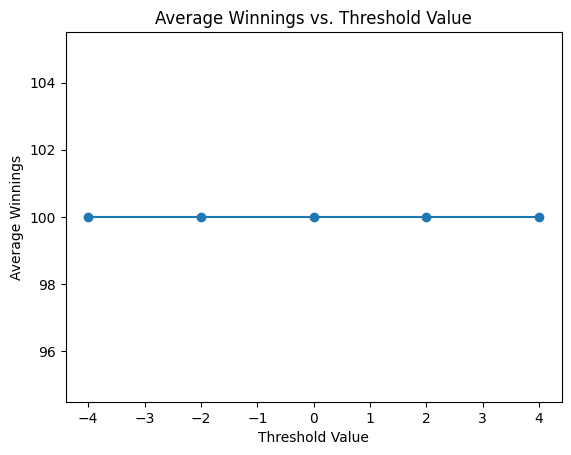

Threshold: -4, Average Winnings: 100.00
Threshold: -2, Average Winnings: 100.00
Threshold: 0, Average Winnings: 100.00
Threshold: 2, Average Winnings: 100.00
Threshold: 4, Average Winnings: 100.00


In [34]:
threshold_values = [-4, -2, 0, 2, 4]
threshold_results = {}

for threshold in threshold_values:
    winnings = simulate_games(threshold=threshold)
    avg_winnings = np.mean(winnings)
    threshold_results[threshold] = avg_winnings

# Plotting the average winnings for each threshold value
plt.plot(threshold_values, [threshold_results[t] for t in threshold_values], marker='o')
plt.xlabel('Threshold Value')
plt.ylabel('Average Winnings')
plt.title('Average Winnings vs. Threshold Value')
plt.show()

# Print the results for each threshold
for threshold, avg_winnings in threshold_results.items():
    print(f"Threshold: {threshold}, Average Winnings: {avg_winnings:.2f}")
